## Task 1. Prepare the environment in Vertex AI Workbench

Lab link: https://partner.cloudskillsboost.google/paths/2309/course_templates/1292/labs/531996

In [1]:
# Install the necessary Google Cloud dependencies using the following command:
!python3 -m pip install --upgrade --quiet google-genai

Restart the runtime. In the Jupyter Lab menus: Kernel > Restart Kernel

In [2]:
# Download a starting product image and a Python file with some helpful image editing helper functions:
!gcloud storage cp gs://qwiklabs-gcp-00-92b2f18d656a-bucket/empty-bowl-on-empty-table.png .
!gcloud storage cp gs://qwiklabs-gcp-00-92b2f18d656a-bucket/image_editing_utils.py .
!gcloud storage cp gs://qwiklabs-gcp-00-92b2f18d656a-bucket/place-setting-mask.png .

Copying gs://qwiklabs-gcp-00-92b2f18d656a-bucket/empty-bowl-on-empty-table.png to file://./empty-bowl-on-empty-table.png
  Completed files 1/1 | 1.4MiB/1.4MiB                                          

Average throughput: 125.2MiB/s
Copying gs://qwiklabs-gcp-00-92b2f18d656a-bucket/image_editing_utils.py to file://./image_editing_utils.py
  Completed files 1/1 | 5.0kiB/5.0kiB                                          
Copying gs://qwiklabs-gcp-00-92b2f18d656a-bucket/place-setting-mask.png to file://./place-setting-mask.png
  Completed files 1/1 | 4.5kiB/4.5kiB                                          


In [3]:
# Import the required libraries:
from google import genai
from google.genai.types import (
    Image,
    EditImageConfig,
    RawReferenceImage,
    MaskReferenceImage,
    MaskReferenceConfig,
)

import image_editing_utils

In [4]:
# Initialize the Google Gen AI SDK with your project and location and define a bucket to be used:
PROJECT_ID = "qwiklabs-gcp-00-92b2f18d656a"
LOCATION = "us-central1"
gcs_bucket = "qwiklabs-gcp-00-92b2f18d656a-bucket"

client = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=LOCATION
)

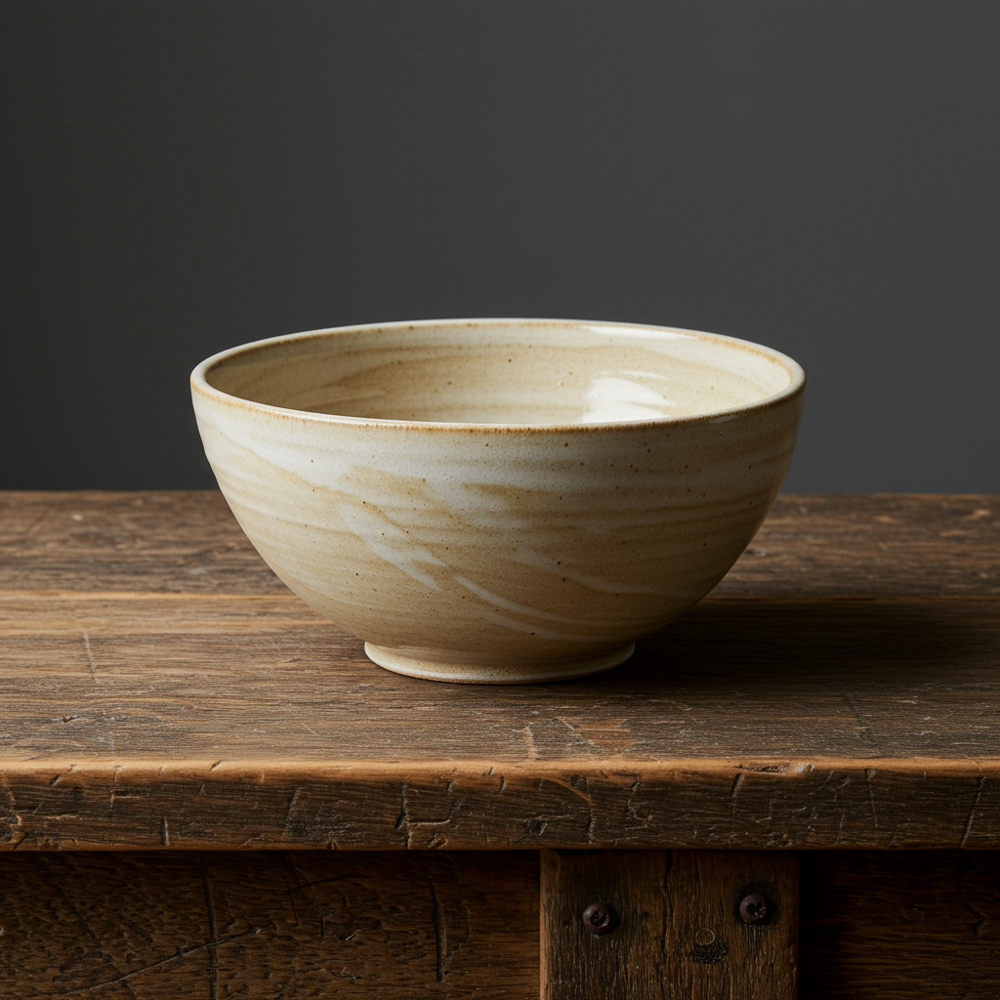

In [5]:
# Display the image of your product, a specific ceramic bowl.
# Throughout this lab, you will edit and enhance the surroundings of this bowl, 
# but you will not allow it to be replaced with a generic different bowl.

original_image = Image.from_file(
    location="empty-bowl-on-empty-table.png",
    mime_type="image/png"
)
original_image.show()

In [6]:
# save a copy of the original_image locally and upload it to Cloud Storage:
dest_filename = "empty-bowl-on-empty-table-copy.png"
original_image.save(dest_filename)

image_editing_utils.upload_file_to_gcs(
    gcs_bucket, dest_filename, dest_filename)

File empty-bowl-on-empty-table-copy.png uploaded to empty-bowl-on-empty-table-copy.png.


## Task 2. Use outpainting to expand your product image's aspect ratio

In [7]:
# In this lab, you will use the imagen-3.0-capability-001 image-editing version
# of Imagen to edit images. Store this model name with:
edit_model_name = "imagen-3.0-capability-001"

In [8]:
# Use a helper function to make both:
#    - a copy of the original image with blank space where you want to fill in
#    - a mask that indicates with while pixels where the editing model should generate new image pixels
target_image_size = (1408, 768)

reframed_image, reframed_mask = image_editing_utils.pad_and_mask_image(
    original_image=original_image,
    target_size=target_image_size,
    vertical_offset_from_bottom=0.5,
    horizontal_offset_from_left=0.1,
)

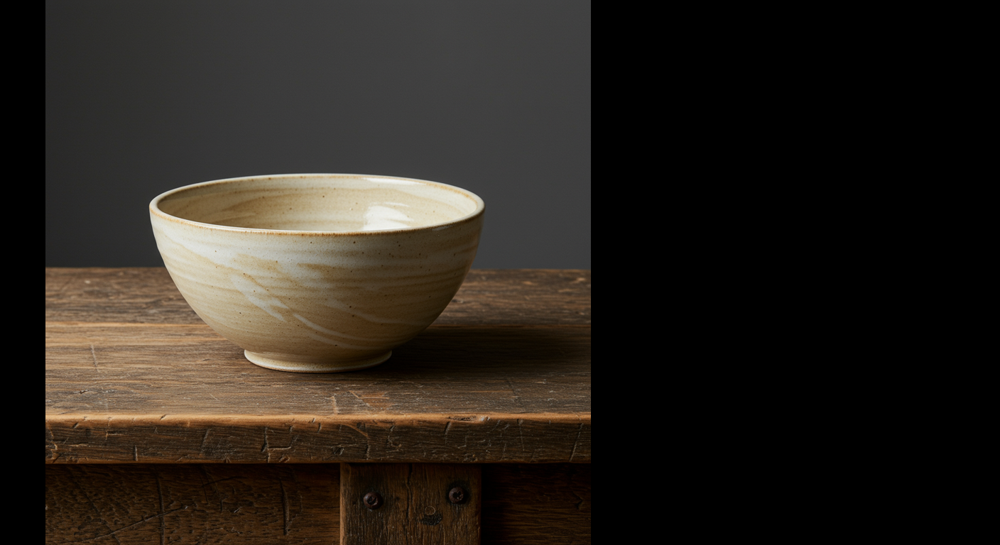

In [9]:
# View the reframed image by running this line in a new cell:
reframed_image.show()

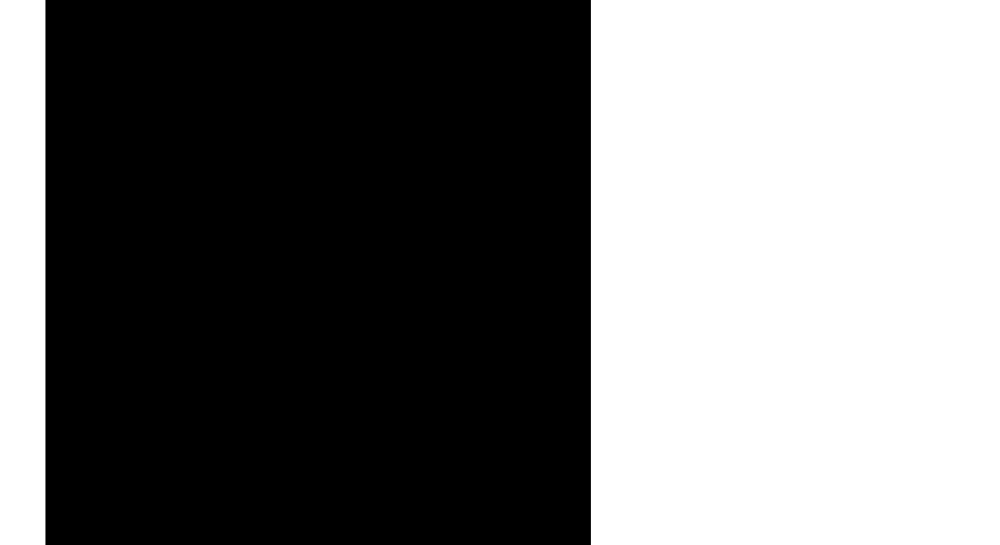

In [10]:
# View the reframed mask (black pixels corresponding to where you have image data, 
# and white pixels corresponding to where new pixels will be generated) by running this line in a new cell:
reframed_mask.show()

In [11]:
# Prepare a RawReferenceImage referencing your reframed_image and a MaskReferenceImage referencing your reframed_mask 
# and providing a MaskReferenceConfig that specifies that this is a user-provided mask:
raw_ref_image = RawReferenceImage(
    # Fill in the appropriate configuration
    reference_image=reframed_image, reference_id=0
)

mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=reframed_mask,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_USER_PROVIDED",
        mask_dilation=0.03,  # (!)
    ),
)

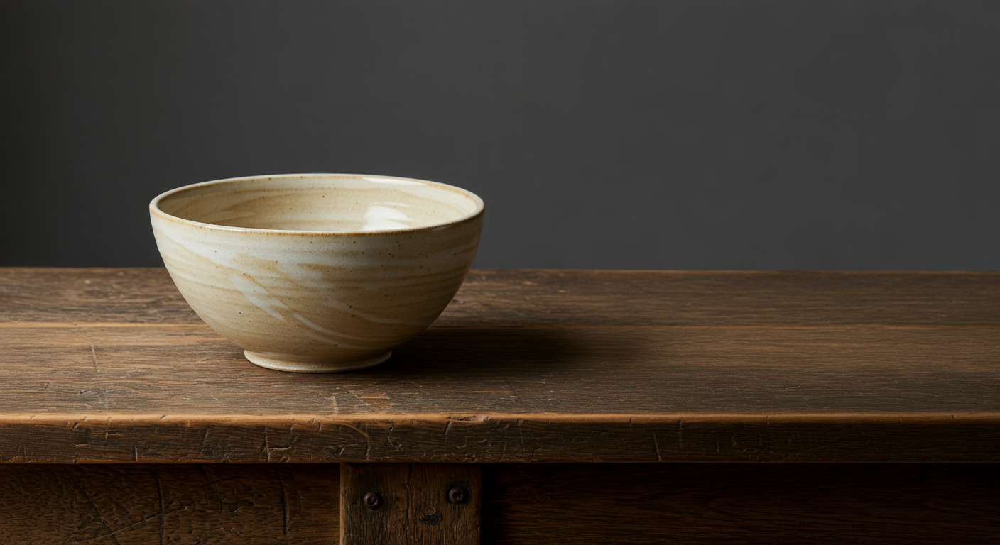

In [12]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE with the correct edit mode in the following cell and run it to expand the image to fill the empty pixels. 
# You should see the resulting image shown after the cell:
outpainted_image = client.models.edit_image(
    model=edit_model_name,
    prompt="",
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_OUTPAINT",   #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        base_steps=35,
        safety_filter_level="BLOCK_ONLY_HIGH",
    ),
)

outpainted_image.generated_images[0].image.show()

In [13]:
# save your outpainted_image locally and upload it to Cloud Storage:
filename = "empty-bowl-on-long-table.png"

outpainted_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File empty-bowl-on-long-table.png uploaded to empty-bowl-on-long-table.png.


## Task 3. Use mask-free editing to make changes to overlapping objects

Your marketing team asks if you can put some grapes in the bowl. Because these items will overlap with the bowl itself, you don't want to mask anything about, but rather edit the image generally.

In [14]:
# To make further edits on the image, reference the appropriate attribute
# of your outpainted_image to create a new RawReferenceImage.
raw_ref_image = RawReferenceImage(
    reference_image=outpainted_image.generated_images[0].image, # Reference your outpainted image here,
    reference_id=0
)

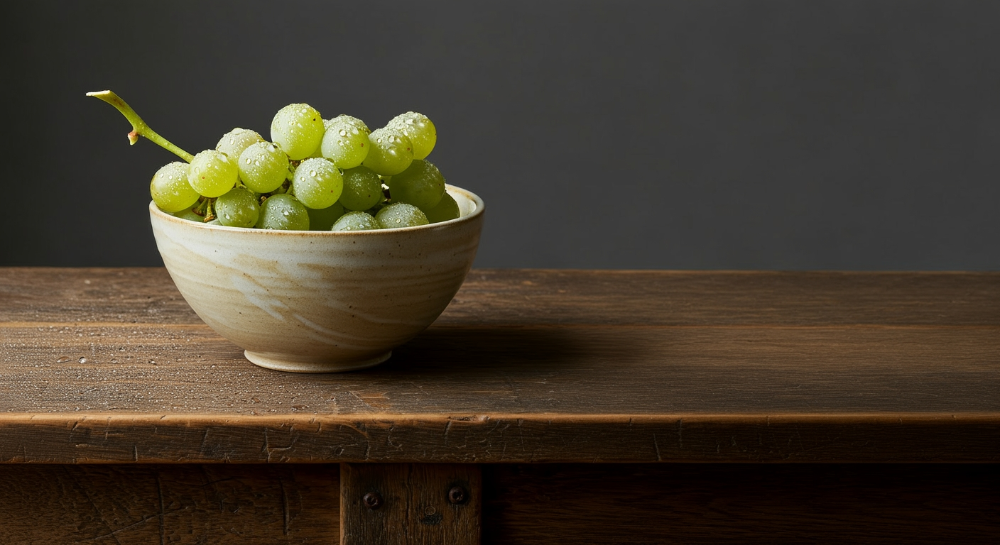

In [15]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode
# to edit the image generally without using a mask. 
# Run the code and make sure you see a result.
edit_prompt = "photoreal wet grapes added to the ceramic bowl[0]."
edited_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_DEFAULT",  #ENTER_THE_CORRECT_EDIT_MODE ,
        base_steps=35,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

edited_image.generated_images[0].image.show()

In [16]:
# save your edited_image locally and upload it to Cloud Storage:
filename = "grapes-in-bowl-on-long-table.png"

edited_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File grapes-in-bowl-on-long-table.png uploaded to grapes-in-bowl-on-long-table.png.


## Task 4. Use inpainting to insert objects into the scene

You will now use a mask to position some additional items to set a scene, providing more of a sense of the bowl being in a real place.

In [17]:
# To continue editing this image, reference the appropriate attribute 
# of your edited_image to create a new RawReferenceImage:
raw_ref_image = RawReferenceImage(
    reference_image=edited_image.generated_images[0].image, # Reference your edited image here,
    reference_id=0
)

In [18]:
# Load the place-setting-mask.png image that has been provided for you as the mask for the next step:
place_setting_mask = Image.from_file(location="place-setting-mask.png")
mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=place_setting_mask,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_USER_PROVIDED",
        mask_dilation=0.01,  # (!)
    ),
)

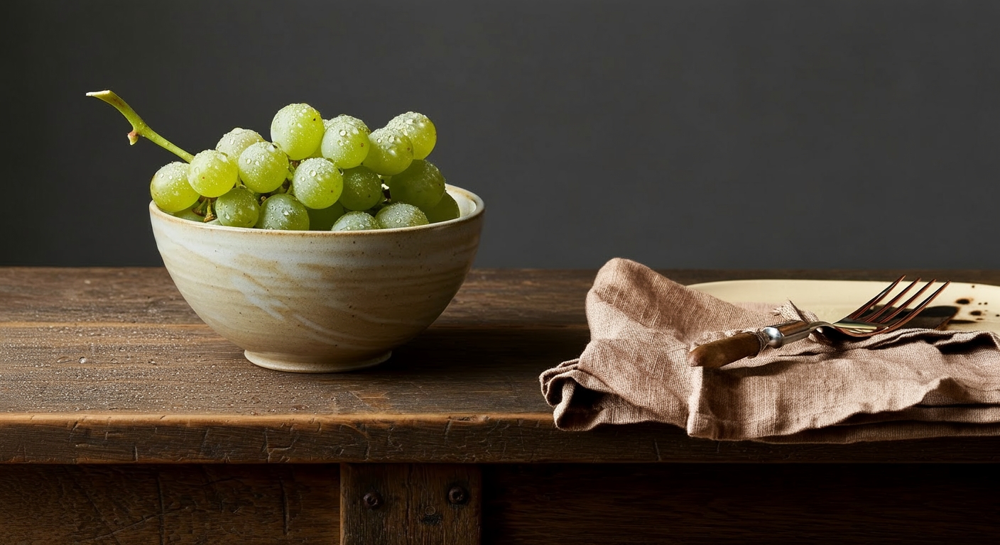

In [19]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode 
# to add objects into the scene according to your mask. 
# Run the code and make sure you see a result.
edit_prompt = "a fork on a napkin and a plate on the rustic table[1]"
inpainted_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_OUTPAINT",  #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

inpainted_image.generated_images[0].image.show()

In [20]:
# save your inpainted_image locally and upload it to Cloud Storage:
filename = "grapes-and-table-setting-on-long-table.png"

inpainted_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File grapes-and-table-setting-on-long-table.png uploaded to grapes-and-table-setting-on-long-table.png.


## Task 5. Clear the table with inpainting removal

Your team is also interested in an empty background shot of the table without the bowl so that they can do some animation and compositing work. They ask if you can provide that for them.

In [21]:
# Reference the appropriate attribute of your inpainted_image to create a new RawReferenceImage:
raw_ref_image = RawReferenceImage(
    reference_image=inpainted_image.generated_images[0].image,  #edited_image.generated_images[0].image, # Reference your inpainted image here,
    reference_id=0
)

In [22]:
# Create a MaskReferenceImage that will automatically detect 
# the foreground objects in the provided reference image:
mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_FOREGROUND", # "MASK_MODE_SEMANTIC",
        segmentation_classes=[67]
    ),
)

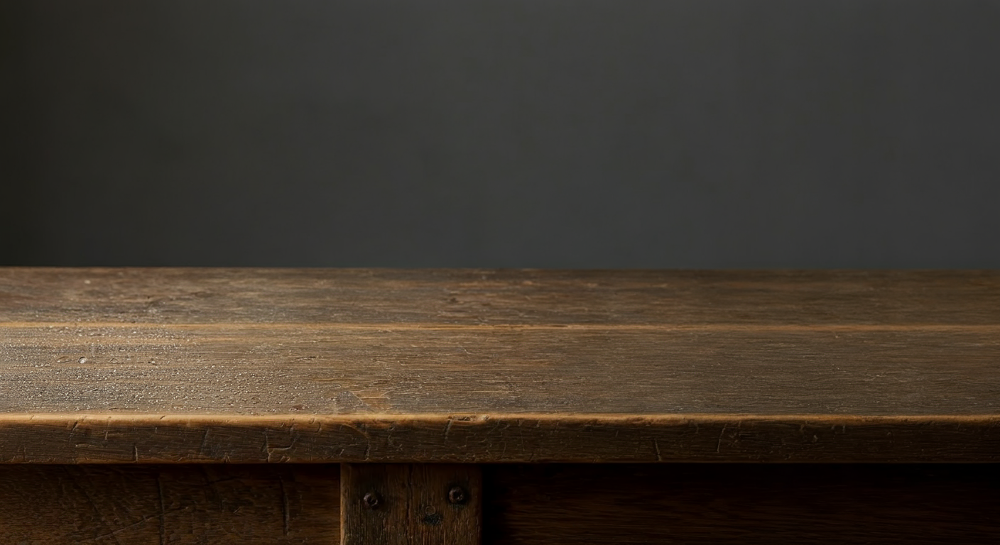

In [27]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below 
# with the correct edit mode to remove the foreground objects detected by the mask segmentation.
# Run the code and make sure you see a result.
edit_prompt = ""
foreground_removed_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_INPAINT_REMOVAL", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

foreground_removed_image.generated_images[0].image.show()

In [28]:
# save your foreground_removed_image locally and upload it to Cloud Storage:
filename = "empty-table.png"

foreground_removed_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File empty-table.png uploaded to empty-table.png.


## Task 6. Use mask segmentation to create a neutral background

While the team wants many of the catalog images you have been asked to create to feel like the bowl is in a real setting, they also want a 'neutral' image in as simple a setting as possible. They ask if you can remove the table, as it has a lot of character on its own, for a more 'neutral' product shot.

In [29]:
# use your original_image again to create a product photo with a neutral background. The RawReferenceImage is provided for you below:
raw_ref_image = RawReferenceImage(
    reference_image=original_image,
    reference_id=0
)

In [31]:
# Create a MaskReferenceImage that will automatically mask out specific classes 
# by their class ID. You can look up the segmentation class for a table in the class reference at the bottom of this lab. 
# Use it to create a segmentation mask for the table:
mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_BACKGROUND",
        segmentation_classes=[67]
    ),
)

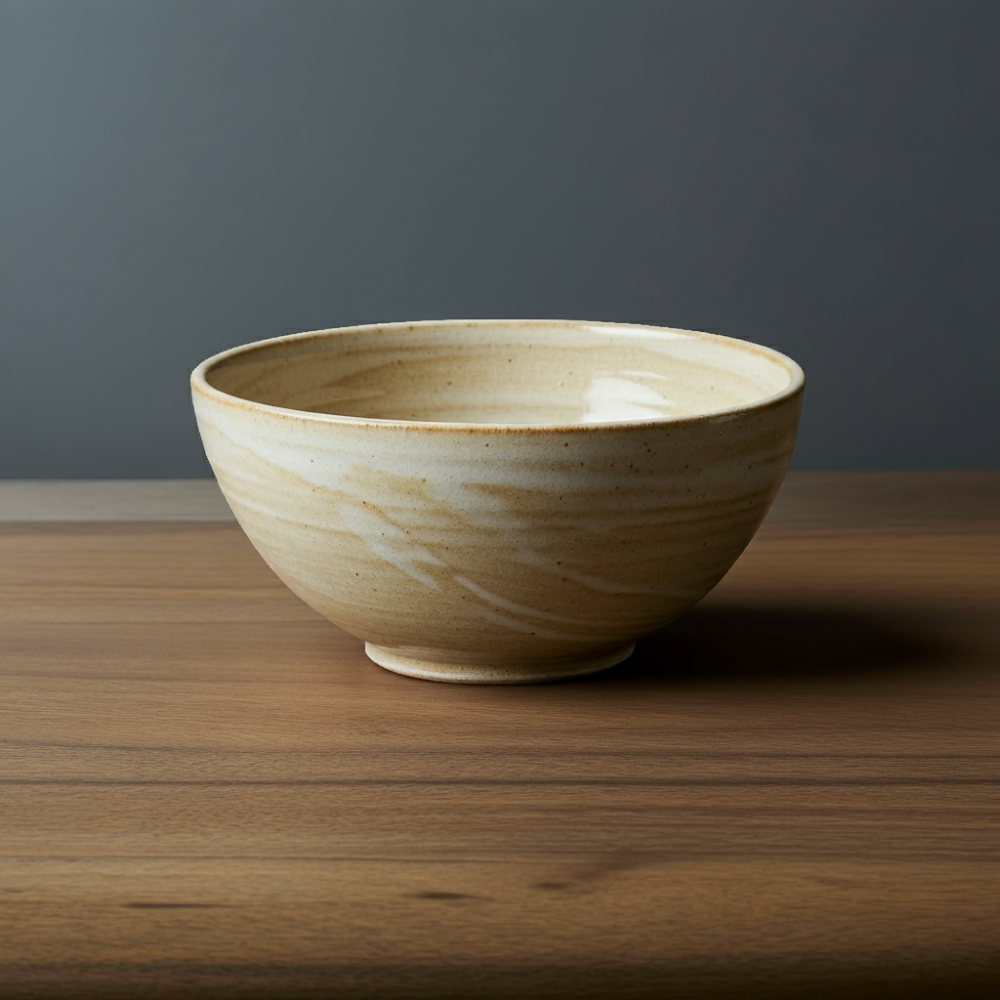

In [32]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode
# to remove the table object detected by the mask segmentation.
# Run the code and make sure you see a result.
edit_prompt = ""
neutral_surface_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_BGSWAP", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

neutral_surface_image.generated_images[0].image.show()

In [33]:
# save your neutral_surface_image locally and upload it to Cloud Storage:
filename = "bowl-on-neutral-surface.png"

neutral_surface_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File bowl-on-neutral-surface.png uploaded to bowl-on-neutral-surface.png.


## Task 7. Swap the background to put the product at a festive party
The team would also like to see the opposite: the bowl in a more fun, party-like environment.

In [34]:
# In this task, you will again use your original_image to create a product photo with a festive party background.
# The RawReferenceImage is the same as in the previous task:
raw_ref_image = RawReferenceImage(
    reference_image=original_image,
    reference_id=0
)

In [35]:
# Create a MaskReferenceImage that will automatically mask the background of the image:
mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(mask_mode="MASK_MODE_BACKGROUND"),
)

In [ ]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to swap the background.
# Run the code and make sure you see a result.
edit_prompt = "A bowl on a table at a fun dinner party"
dinner_party_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode="EDIT_MODE_BGSWAP", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

dinner_party_image.generated_images[0].image.show()

In [ ]:
# save your dinner_party_image locally and upload it to Cloud Storage:
